In [87]:
#imports
import pandas as pd
import numpy as np
import locale

#display all rows of any dfs in this notebook
pd.set_option('display.max_rows', None)

#display all columns of any dfs in this notebook
pd.set_option('display.max_columns', None)

In [88]:
#import
import requests
from bs4 import BeautifulSoup

In [89]:
#visit the webpage 
url = 'https://www.worldeconomics.com/Indicator-Data/ESG/Environment/Temperatures/'

In [90]:
#check if we can parse the website
response = requests.get(url)
response

<Response [200]>

In [91]:
# parse the webpage by using the BeautifulSoup Library and the html parser
soup = BeautifulSoup(response.text, 'html.parser')
soup


<!DOCTYPE html>

<html xmlns="http://www.w3.org/1999/xhtml">
<head>
<!-- Global site tag (gtag.js) - Google Analytics -->
<script async="" src="https://www.googletagmanager.com/gtag/js?id=UA-54716815-1"></script>
<script>
        window.dataLayer = window.dataLayer || [];
        function gtag() { dataLayer.push(arguments); }
        gtag('js', new Date());

        gtag('config', 'UA-54716815-1');
    </script>
<title>
	Temperature Data By Country
</title><meta content="World Economics has collated temperature data by country which is presebted for the periods below to assess temperature changes over time." name="Description"/>
<meta content="Temperature, Climate, Environment, Data" name="Keywords"/>
<meta charset="utf-8"/><meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/><meta content="width=device-width, initial-scale=1.0" name="viewport"/><meta content="500" http-equiv="refresh"/><meta content="index,follow,noarchive" name="ROBOTS"/><link href="https://www.worldeconom

In [92]:
#check how many tables does the website have
len(soup.find_all('table'))

1

In [93]:
#find all tables and store them in a variable named tables
tables = soup.find_all('table')

#loop through tables
#for each table in tables
for table in tables:
    
    #find all rows and store them in a variable
    rows = table.find_all('tr')
    
    #now, loop through rows
    #for each row in rows
    for row in rows:
        
        #find all cells and store them in a variable
        cells = row.find_all('td')
        
        #for each cell in cells
        for cell in cells:
            #just print it to check out what you are getting
            print(cell.text)

Country 
Temperature100-Year Avg.1922-2022Centigrade
Temperature50-Year Avg.1972-2022Centigrade
Temperature25-Year Avg.1997-2022Centigrade
Temperature10-Year Avg.2012-2022Centigrade
TemperatureLatest2022Centigrade
Burkina Faso
28.9°
29.1°
29.4°
29.5°
29.3°
Mali
28.8°
29.1°
29.3°
29.3°
29.2°
Qatar
27.3°
27.7°
28.3°
28.6°
29.1°
Senegal
28.4°
28.7°
29.0°
29.1°
29.0°
Mauritania
28.4°
28.6°
28.9°
29.0°
28.9°
United Arab Emirates
27.6°
27.9°
28.4°
28.6°
28.9°
Bahrain
26.9°
27.4°
28.0°
28.3°
28.8°
Benin
27.7°
27.9°
28.2°
28.3°
28.7°
Gambia
27.9°
28.1°
28.5°
28.6°
28.5°
Guinea-Bissau
27.5°
27.7°
28.1°
28.2°
28.1°
Oman
27.2°
27.4°
27.8°
27.9°
27.9°
Ghana
27.3°
27.5°
27.8°
27.9°
27.7°
Singapore
27.2°
27.4°
27.8°
27.9°
27.7°
Sudan
27.3°
27.7°
28.1°
28.1°
27.6°
Niger
27.7°
27.8°
28.1°
28.1°
27.6°
Kuwait
25.6°
26.0°
26.6°
27.0°
27.6°
Togo
27.0°
27.2°
27.5°
27.6°
27.5°
Cambodia
27.0°
27.2°
27.4°
27.6°
27.3°
Chad
27.1°
27.4°
27.7°
27.7°
27.3°
Sri Lanka
26.7°
27.1°
27.3°
27.4°
27.2°
Nigeria
27.0°
27.1

In [94]:
#Step 1: create an empty list named data
data = []

#Step 2: find all tables on the webpage and store them into a variable named tables
tables = soup.find_all('table')

#Step 3: loop through your tables 
#for each table in tables
for table in tables:

    #find all rows except from the first one that are the headlines
    rows = table.find_all('tr')[1:]
    
    #forw each row in rows
    for row in rows:
        
        print(row)

        #find all cell values
        cells = row.find_all('td')
        
        #define countries,temp_100_year_avg, temp_50_year_avg,temp_25_year_avg, temp_10_year_avg, avg_2002 are found in your list of cell values 
        countries = cells[0::6]
        timesekato = cells[1::6]
        timespeninta = cells[2::6]
        timess = cells[3::6]
        timesdeka = cells[4::6]
        avgs = cells[5::6]
        #Step 4: create an empty dictionary named mydata
        mydata = {}
        
      
        
        #you have only one caption per table. But you have many cpuntries in each table!
        #loop through your countries
        #for each country in countries
        for country in countries:
            #create a dict key named countrie sand store the country value there. 
            #it gonna store all the country values, because you are looping through countries!
            mydata['country'] = country.text.strip()
            print(country.text)
    
        #do the same for the other values
        for temp_100_year_avg_1922_2022 in timesekato:
            mydata['temp_100_year_avg_1922_2022'] = temp_100_year_avg_1922_2022.text.strip()
            print(temp_100_year_avg_1922_2022.text)
            
        for temp_50_year_avg_1972_2022 in timespeninta:
            mydata['temp_50_year_avg_1972_2022'] = temp_50_year_avg_1972_2022.text.strip()
            print(temp_50_year_avg_1972_2022.text)
            
        for temp_25_year_avg_1997_2022 in timess:
            mydata['temp_25_year_avg_1997_2022'] = temp_25_year_avg_1997_2022.text.strip()
            print(temp_25_year_avg_1997_2022.text)
            
        for temp_10_year_avg_2012_2022 in timesdeka:
            mydata['temp_10_year_avg_2012_2022'] = temp_10_year_avg_2012_2022.text.strip()
            print(temp_10_year_avg_2012_2022.text)
            
        for avg_2022 in avgs:
            mydata['avg_2022'] = avg_2022.text.strip()
            print(avg_2022.text)
    

        #Step 5: append your data list with whatever your mydata dictionary holds    
        data.append(mydata)
      

<tr class="trRegular">
<td class="tb1"><a href="/ESG/Environment/Temperatures/Burkina Faso.aspx">Burkina Faso</a></td>
<td class="tb2">28.9°</td>
<td class="tb3">29.1°</td>
<td class="tb4">29.4°</td>
<td class="tb5">29.5°</td>
<td class="tb6" style="border-left:solid 1px black">29.3°</td>
</tr>
Burkina Faso
28.9°
29.1°
29.4°
29.5°
29.3°
<tr class="trRegular">
<td class="tb1"><a href="/ESG/Environment/Temperatures/Mali.aspx">Mali</a></td>
<td class="tb2">28.8°</td>
<td class="tb3">29.1°</td>
<td class="tb4">29.3°</td>
<td class="tb5">29.3°</td>
<td class="tb6" style="border-left:solid 1px black">29.2°</td>
</tr>
Mali
28.8°
29.1°
29.3°
29.3°
29.2°
<tr class="trRegular">
<td class="tb1"><a href="/ESG/Environment/Temperatures/Qatar.aspx">Qatar</a></td>
<td class="tb2">27.3°</td>
<td class="tb3">27.7°</td>
<td class="tb4">28.3°</td>
<td class="tb5">28.6°</td>
<td class="tb6" style="border-left:solid 1px black">29.1°</td>
</tr>
Qatar
27.3°
27.7°
28.3°
28.6°
29.1°
<tr class="trRegular">
<td c

In [95]:
#turn this list into a dataframe
df = pd.DataFrame(data)
df

,country,temp_100_year_avg_1922_2022,temp_50_year_avg_1972_2022,temp_25_year_avg_1997_2022,temp_10_year_avg_2012_2022,avg_2022
0,Burkina Faso,28.9°,29.1°,29.4°,29.5°,29.3°
1,Mali,28.8°,29.1°,29.3°,29.3°,29.2°
2,Qatar,27.3°,27.7°,28.3°,28.6°,29.1°
3,Senegal,28.4°,28.7°,29.0°,29.1°,29.0°
4,Mauritania,28.4°,28.6°,28.9°,29.0°,28.9°
5,United Arab Emirates,27.6°,27.9°,28.4°,28.6°,28.9°
6,Bahrain,26.9°,27.4°,28.0°,28.3°,28.8°
7,Benin,27.7°,27.9°,28.2°,28.3°,28.7°
8,Gambia,27.9°,28.1°,28.5°,28.6°,28.5°
9,Guinea-Bissau,27.5°,27.7°,28.1°,28.2°,28.1°


In [96]:
#save the df into your folder to make sure
df.to_csv('average_temps.csv',index=False)
df.to_excel('average_temps.xlsx')

In [97]:
#keep only the rows that you need. In this case we need the rows for Greece, Croatia, Italy, Spain, Portugal
df = df[(df.country=='Greece')|(df.country== 'Italy')| (df.country=='Spain')| (df.country=='Portugal')]
df

,country,temp_100_year_avg_1922_2022,temp_50_year_avg_1972_2022,temp_25_year_avg_1997_2022,temp_10_year_avg_2012_2022,avg_2022
96,Portugal,15.3°,15.6°,16.0°,16.2°,16.9°
99,Spain,13.4°,13.8°,14.2°,14.5°,15.3°
100,Greece,13.9°,14.0°,14.5°,14.8°,14.9°
103,Italy,12.6°,12.9°,13.4°,13.7°,14.4°


In [98]:
#fix the numeration
df = df.reset_index().drop(['index'],axis=1)

df

,country,temp_100_year_avg_1922_2022,temp_50_year_avg_1972_2022,temp_25_year_avg_1997_2022,temp_10_year_avg_2012_2022,avg_2022
0,Portugal,15.3°,15.6°,16.0°,16.2°,16.9°
1,Spain,13.4°,13.8°,14.2°,14.5°,15.3°
2,Greece,13.9°,14.0°,14.5°,14.8°,14.9°
3,Italy,12.6°,12.9°,13.4°,13.7°,14.4°


In [99]:
#call the data you have stored in your folder
temp_change = pd.read_csv('Annual_Surface_Temperature_Change.csv')
temp_change

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,F1961,F1962,F1963,F1964,F1965,F1966,F1967,F1968,F1969,F1970,F1971,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",-0.113,-0.164,0.847,-0.764,-0.244,0.226,-0.371,-0.423,-0.539,0.813,0.619,-1.124,0.232,-0.489,-0.445,-0.286,0.513,0.129,0.361,0.600,0.483,-0.346,0.164,0.145,0.283,-0.141,0.391,0.919,-0.205,0.730,-0.168,-0.294,0.220,0.430,0.359,-0.116,0.471,0.675,1.198,0.993,1.311,1.365,0.587,1.373,0.401,1.720,0.675,0.704,0.895,1.613,1.397,0.223,1.281,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012
1,2,Albania,AL,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.627,0.326,0.075,-0.166,-0.388,0.559,-0.074,0.081,-0.013,-0.106,-0.195,-0.069,-0.288,-0.139,-0.211,-0.683,0.545,-0.814,0.203,-0.414,-0.351,0.173,-0.128,-0.270,-0.103,0.569,-0.106,0.370,-0.066,0.795,-0.269,0.106,0.076,1.330,-0.172,-0.038,0.075,0.795,0.670,1.065,1.532,0.492,0.970,0.444,0.189,0.345,1.316,0.978,0.910,1.191,1.055,1.487,1.333,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518
2,3,Algeria,DZ,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.164,0.114,0.077,0.250,-0.100,0.433,-0.026,-0.067,0.291,0.116,-0.385,-0.348,-0.015,-0.503,-0.539,-0.782,0.504,0.012,0.654,0.232,0.215,0.399,0.560,-0.004,0.508,0.296,0.975,1.304,0.386,1.266,0.031,-0.312,0.552,0.732,0.595,0.846,1.059,1.109,1.476,0.820,1.856,1.258,1.585,0.988,1.264,1.395,1.220,1.185,0.945,2.265,1.398,1.147,1.192,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688
3,4,American Samoa,AS,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.079,-0.042,0.169,-0.140,-0.562,0.181,-0.368,-0.187,0.132,-0.047,-0.477,-0.067,0.330,-0.308,-0.118,-0.177,0.156,0.092,0.341,0.350,0.179,0.280,0.313,0.277,0.256,0.394,0.354,0.509,0.143,0.497,0.641,0.344,-0.069,0.189,0.755,0.784,NaN,NaN,0.242,0.626,0.904,1.152,0.716,0.191,0.801,0.403,1.032,0.670,NaN,1.311,0.854,0.924,1.257,1.170,1.009,1.539,1.435,1.189,1.539,1.430,1.268,1.256
4,5,"Andorra, Principality of",AD,AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.736,0.112,-0.752,0.308,-0.490,0.415,0.637,0.018,-0.137,0.121,-0.326,-0.499,0.025,-0.371,0.246,-0.045,-0.093,-0.163,0.058,-0.188,0.178,1.044,0.859,-0.157,0.059,0.387,0.397,0.883,1.162,1.736,0.231,0.386,0.174,1.508,1.279,0.570,1.788,1.018,1.055,1.050,1.480,0.835,1.949,0.936,0.851,1.485,1.024,0.946,1.413,0.471,1.677,1.265,0.831,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243
5,6,Angola,AO,AGO,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.041,-0.152,-0.190,-0.229,-0.196,0.175,-0.081,-0.193,0.188,0.248,-0.097,-0.035,0.475,-0.158,-0.029,-0.313,0.272,0.037,0.291,0.279,-0.071,0.164,0.487,0.631,0.694,0.176,0.689,0.572,-0.055,0.687,0.341,0.466,0.256,0.212,0.753,0.370,0.107,1.064,0.417,0.169,0.29

In [100]:
#check how many rows and columns does it have
temp_change.shape

(225, 72)

In [101]:
#keep only the rows for the countries we are studying
temp_change = temp_change[(temp_change.Country.str.contains('Greece',case=False))|(temp_change.Country.str.contains('Italy', case=False))| (temp_change.Country.str.contains('Spain', case=False))| (temp_change.Country.str.contains('Portugal',case=False))]
temp_change

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,F1961,F1962,F1963,F1964,F1965,F1966,F1967,F1968,F1969,F1970,F1971,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
77,78,Greece,GR,GRC,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.479,0.619,0.305,-0.301,-0.322,0.790,-0.194,0.182,-0.090,0.269,-0.222,-0.177,-0.357,-0.193,-0.250,-0.916,0.330,-0.555,0.179,-0.379,-0.191,-0.243,-0.493,-0.123,-0.063,0.312,-0.395,0.129,-0.204,0.368,-0.197,-0.528,-0.328,1.060,-0.043,-0.161,-0.195,0.632,0.800,0.679,1.314,0.435,0.385,0.337,0.213,0.254,1.080,0.881,0.771,1.584,0.394,1.235,1.317,1.060,0.904,1.561,0.642,1.905,1.381,1.307,1.655,1.040
97,98,Italy,IT,ITA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.805,0.025,-0.365,0.131,-0.431,0.307,0.301,0.011,-0.107,-0.153,-0.149,-0.132,0.034,-0.115,0.075,-0.320,0.283,-0.537,0.022,-0.421,-0.279,0.511,0.384,-0.468,0.117,0.436,0.192,0.842,0.417,1.132,0.029,0.542,0.527,1.513,0.418,0.233,0.931,0.969,0.918,1.243,1.533,0.913,1.526,0.746,0.563,0.840,1.552,1.133,1.234,0.755,1.253,1.543,1.006,1.638,1.704,1.716,1.606,1.834,1.698,1.902,1.569,2.135
161,162,Portugal,PT,PRT,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.815,0.524,-0.086,0.519,-0.230,0.280,-0.041,0.033,-0.342,0.071,-0.870,-0.906,-0.063,-0.439,-0.090,-0.357,-0.272,0.167,0.169,0.282,0.546,0.560,0.286,-0.120,0.528,0.094,0.752,0.637,1.117,1.401,0.440,0.434,-0.199,0.684,1.663,0.756,1.601,1.212,0.634,0.665,1.165,0.681,1.458,1.062,1.032,1.561,0.775,0.649,1.423,1.122,1.615,0.797,0.941,1.349,1.405,1.682,2.109,0.906,1.291,1.990,1.251,2.318
184,185,Spain,ES,ESP,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",0.728,0.411,-0.233,0.486,-0.200,0.392,0.146,0.093,-0.285,0.131,-0.741,-0.825,-0.164,-0.434,-0.091,-0.367,-0.160,0.101,0.276,0.186,0.344,0.709,0.550,-0.163,0.484,0.259,0.724,0.796,1.039,1.446,0.209,0.305,-0.059,1.044,1.444,0.722,1.535,1.189,0.814,0.810,1.406,0.812,1.598,1.004,0.902,1.526,0.835,0.864,1.360,0.908,1.613,1.043,0.906,1.603,1.533,1.714,2.036,1.149,1.534,2.083,1.431,2.489


In [102]:
#keep only the columns we need, and the dates we are studying
df2 = temp_change.loc[:, ['Country', 'Indicator', 'Unit'] + [f'F{i}' for i in range(1972, 2023)]]

# Display the resulting DataFrame
df2

,Country,Indicator,Unit,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
77,Greece,Temperature change with respect to a baseline ...,Degree Celsius,-0.177,-0.357,-0.193,-0.250,-0.916,0.330,-0.555,0.179,-0.379,-0.191,-0.243,-0.493,-0.123,-0.063,0.312,-0.395,0.129,-0.204,0.368,-0.197,-0.528,-0.328,1.060,-0.043,-0.161,-0.195,0.632,0.800,0.679,1.314,0.435,0.385,0.337,0.213,0.254,1.080,0.881,0.771,1.584,0.394,1.235,1.317,1.060,0.904,1.561,0.642,1.905,1.381,1.307,1.655,1.040
97,Italy,Temperature change with respect to a baseline ...,Degree Celsius,-0.132,0.034,-0.115,0.075,-0.320,0.283,-0.537,0.022,-0.421,-0.279,0.511,0.384,-0.468,0.117,0.436,0.192,0.842,0.417,1.132,0.029,0.542,0.527,1.513,0.418,0.233,0.931,0.969,0.918,1.243,1.533,0.913,1.526,0.746,0.563,0.840,1.552,1.133,1.234,0.755,1.253,1.543,1.006,1.638,1.704,1.716,1.606,1.834,1.698,1.902,1.569,2.135
161,Portugal,Temperature change with respect to a baseline ...,Degree Celsius,-0.906,-0.063,-0.439,-0.090,-0.357,-0.272,0.167,0.169,0.282,0.546,0.560,0.286,-0.120,0.528,0.094,0.752,0.637,1.117,1.401,0.440,0.434,-0.199,0.684,1.663,0.756,1.601,1.212,0.634,0.665,1.165,0.681,1.458,1.062,1.032,1.561,0.775,0.649,1.423,1.122,1.615,0.797,0.941,1.349,1.405,1.682,2.109,0.906,1.291,1.990,1.251,2.318
184,Spain,Temperature change with respect to a baseline ...,Degree Celsius,-0.825,-0.164,-0.434,-0.091,-0.367,-0.160,0.101,0.276,0.186,0.344,0.709,0.550,-0.163,0.484,0.259,0.724,0.796,1.039,1.446,0.209,0.305,-0.059,1.044,1.444,0.722,1.535,1.189,0.814,0.810,1.406,0.812,1.598,1.004,0.902,1.526,0.835,0.864,1.360,0.908,1.613,1.043,0.906,1.603,1.533,1.714,2.036,1.149,1.534,2.083,1.431,2.489


In [103]:
#rename the columns without capital letters, especially "country" so that we can merge the two dataframes we have so far
df2 = df2.rename(columns={df2.columns[0]:'country',
                         df2.columns[1]:'indicator',
                         df2.columns[2]:'unit'})

In [104]:
#fix the numeration
df2 = df2.reset_index().drop(['index'],axis=1)

df2

,country,indicator,unit,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
0,Greece,Temperature change with respect to a baseline ...,Degree Celsius,-0.177,-0.357,-0.193,-0.250,-0.916,0.330,-0.555,0.179,-0.379,-0.191,-0.243,-0.493,-0.123,-0.063,0.312,-0.395,0.129,-0.204,0.368,-0.197,-0.528,-0.328,1.060,-0.043,-0.161,-0.195,0.632,0.800,0.679,1.314,0.435,0.385,0.337,0.213,0.254,1.080,0.881,0.771,1.584,0.394,1.235,1.317,1.060,0.904,1.561,0.642,1.905,1.381,1.307,1.655,1.040
1,Italy,Temperature change with respect to a baseline ...,Degree Celsius,-0.132,0.034,-0.115,0.075,-0.320,0.283,-0.537,0.022,-0.421,-0.279,0.511,0.384,-0.468,0.117,0.436,0.192,0.842,0.417,1.132,0.029,0.542,0.527,1.513,0.418,0.233,0.931,0.969,0.918,1.243,1.533,0.913,1.526,0.746,0.563,0.840,1.552,1.133,1.234,0.755,1.253,1.543,1.006,1.638,1.704,1.716,1.606,1.834,1.698,1.902,1.569,2.135
2,Portugal,Temperature change with respect to a baseline ...,Degree Celsius,-0.906,-0.063,-0.439,-0.090,-0.357,-0.272,0.167,0.169,0.282,0.546,0.560,0.286,-0.120,0.528,0.094,0.752,0.637,1.117,1.401,0.440,0.434,-0.199,0.684,1.663,0.756,1.601,1.212,0.634,0.665,1.165,0.681,1.458,1.062,1.032,1.561,0.775,0.649,1.423,1.122,1.615,0.797,0.941,1.349,1.405,1.682,2.109,0.906,1.291,1.990,1.251,2.318
3,Spain,Temperature change with respect to a baseline ...,Degree Celsius,-0.825,-0.164,-0.434,-0.091,-0.367,-0.160,0.101,0.276,0.186,0.344,0.709,0.550,-0.163,0.484,0.259,0.724,0.796,1.039,1.446,0.209,0.305,-0.059,1.044,1.444,0.722,1.535,1.189,0.814,0.810,1.406,0.812,1.598,1.004,0.902,1.526,0.835,0.864,1.360,0.908,1.613,1.043,0.906,1.603,1.533,1.714,2.036,1.149,1.534,2.083,1.431,2.489


In [105]:
#merge the two dataframes
df3 =  pd.merge(df, df2, on = 'country', how = 'outer')
df3

,country,temp_100_year_avg_1922_2022,temp_50_year_avg_1972_2022,temp_25_year_avg_1997_2022,temp_10_year_avg_2012_2022,avg_2022,indicator,unit,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
0,Portugal,15.3°,15.6°,16.0°,16.2°,16.9°,Temperature change with respect to a baseline ...,Degree Celsius,-0.906,-0.063,-0.439,-0.090,-0.357,-0.272,0.167,0.169,0.282,0.546,0.560,0.286,-0.120,0.528,0.094,0.752,0.637,1.117,1.401,0.440,0.434,-0.199,0.684,1.663,0.756,1.601,1.212,0.634,0.665,1.165,0.681,1.458,1.062,1.032,1.561,0.775,0.649,1.423,1.122,1.615,0.797,0.941,1.349,1.405,1.682,2.109,0.906,1.291,1.990,1.251,2.318
1,Spain,13.4°,13.8°,14.2°,14.5°,15.3°,Temperature change with respect to a baseline ...,Degree Celsius,-0.825,-0.164,-0.434,-0.091,-0.367,-0.160,0.101,0.276,0.186,0.344,0.709,0.550,-0.163,0.484,0.259,0.724,0.796,1.039,1.446,0.209,0.305,-0.059,1.044,1.444,0.722,1.535,1.189,0.814,0.810,1.406,0.812,1.598,1.004,0.902,1.526,0.835,0.864,1.360,0.908,1.613,1.043,0.906,1.603,1.533,1.714,2.036,1.149,1.534,2.083,1.431,2.489
2,Greece,13.9°,14.0°,14.5°,14.8°,14.9°,Temperature change with respect to a baseline ...,Degree Celsius,-0.177,-0.357,-0.193,-0.250,-0.916,0.330,-0.555,0.179,-0.379,-0.191,-0.243,-0.493,-0.123,-0.063,0.312,-0.395,0.129,-0.204,0.368,-0.197,-0.528,-0.328,1.060,-0.043,-0.161,-0.195,0.632,0.800,0.679,1.314,0.435,0.385,0.337,0.213,0.254,1.080,0.881,0.771,1.584,0.394,1.235,1.317,1.060,0.904,1.561,0.642,1.905,1.381,1.307,1.655,1.040
3,Italy,12.6°,12.9°,13.4°,13.7°,14.4°,Temperature change with respect to a baseline ...,Degree Celsius,-0.132,0.034,-0.115,0.075,-0.320,0.283,-0.537,0.022,-0.421,-0.279,0.511,0.384,-0.468,0.117,0.436,0.192,0.842,0.417,1.132,0.029,0.542,0.527,1.513,0.418,0.233,0.931,0.969,0.918,1.243,1.533,0.913,1.526,0.746,0.563,0.840,1.552,1.133,1.234,0.755,1.253,1.543,1.006,1.638,1.704,1.716,1.606,1.834,1.698,1.902,1.569,2.135


In [106]:
#save it into your folder
df3.to_csv('anodosthermokrasiasapo1972.csv',index=False)
df3.to_excel('anodosthermokrasiasapo1972.xlsx')

In [107]:
#check the df4 types
df3.dtypes

country                         object
temp_100_year_avg_1922_2022     object
temp_50_year_avg_1972_2022      object
temp_25_year_avg_1997_2022      object
temp_10_year_avg_2012_2022      object
avg_2022                        object
indicator                       object
unit                            object
F1972                          float64
F1973                          float64
F1974                          float64
F1975                          float64
F1976                          float64
F1977                          float64
F1978                          float64
F1979                          float64
F1980                          float64
F1981                          float64
F1982                          float64
F1983                          float64
F1984                          float64
F1985                          float64
F1986                          float64
F1987                          float64
F1988                          float64
F1989                    

In [108]:
#replace '°' with nothing
df3['avg_2022'] = df3['avg_2022'].str.replace('°', '')
df3['temp_100_year_avg_1922_2022'] = df3['temp_100_year_avg_1922_2022'].str.replace('°', '')
df3['temp_50_year_avg_1972_2022'] = df3['temp_50_year_avg_1972_2022'].str.replace('°', '')
df3['temp_25_year_avg_1997_2022'] = df3['temp_25_year_avg_1997_2022'].str.replace('°', '')
df3['temp_10_year_avg_2012_2022'] = df3['temp_10_year_avg_2012_2022'].str.replace('°', '')


In [109]:
#turn the types into float
df3['avg_2022'] = df3.avg_2022.astype(float)
df3['temp_100_year_avg_1922_2022'] = df3.temp_100_year_avg_1922_2022.astype(float)
df3['temp_50_year_avg_1972_2022'] = df3.temp_50_year_avg_1972_2022.astype(float)
df3['temp_25_year_avg_1997_2022'] = df3.temp_25_year_avg_1997_2022.astype(float)
df3['temp_10_year_avg_2012_2022'] = df3.temp_10_year_avg_2012_2022.astype(float)
df3.dtypes

country                         object
temp_100_year_avg_1922_2022    float64
temp_50_year_avg_1972_2022     float64
temp_25_year_avg_1997_2022     float64
temp_10_year_avg_2012_2022     float64
avg_2022                       float64
indicator                       object
unit                            object
F1972                          float64
F1973                          float64
F1974                          float64
F1975                          float64
F1976                          float64
F1977                          float64
F1978                          float64
F1979                          float64
F1980                          float64
F1981                          float64
F1982                          float64
F1983                          float64
F1984                          float64
F1985                          float64
F1986                          float64
F1987                          float64
F1988                          float64
F1989                    

In [110]:
#call the data about extreme weather from your folder 
ext_weath =  pd.read_excel('akraiafainomena_data.xlsx')
ext_weath

,DisNo.,Historic,Classification Key,Disaster Group,Disaster Subgroup,Disaster Type,Disaster Subtype,External IDs,Event Name,ISO,Country,Subregion,Region,Location,Origin,Associated Types,OFDA Response,Appeal,Declaration,AID Contribution ('000 US$),Magnitude,Magnitude Scale,Latitude,Longitude,River Basin,Start Year,Start Month,Start Day,End Year,End Month,End Day,Total Deaths,No. Injured,No. Affected,No. Homeless,Total Affected,Reconstruction Costs ('000 US$),"Reconstruction Costs, Adjusted ('000 US$)",Insured Damage ('000 US$),"Insured Damage, Adjusted ('000 US$)",Total Damage ('000 US$),"Total Damage, Adjusted ('000 US$)",CPI,Admin Units,Entry Date,Last Update
0,1972-0004-FRA,Yes,tec-tra-rai-rai,Technological,Transport,Rail,Rail,NaN,NaN,FRA,France,Western Europe,Europe,Near Soissons,NaN,NaN,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,6.0,16.0,1972,6.0,16.0,108.0,111.0,NaN,NaN,111.0,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
1,1972-0025-YUG,Yes,nat-bio-epi-vir,Natural,Biological,Epidemic,Viral disease,NaN,NaN,YUG,Yugoslavia,Southern Europe,Europe,"Belgrade, Cacak (Serbia)",NaN,NaN,Yes,No,No,NaN,NaN,Vaccinated,NaN,NaN,NaN,1972,3.0,7.0,1972,3.0,7.0,35.0,NaN,174.0,NaN,174.0,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
2,1972-0044-ESP,Yes,tec-tra-rai-rai,Technological,Transport,Rail,Rail,NaN,NaN,ESP,Spain,Southern Europe,Europe,Lebrija (near Seville),NaN,NaN,Yes,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,7.0,21.0,1972,7.0,21.0,84.0,100.0,NaN,NaN,100.0,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
3,1972-0048-DDR,Yes,tec-tra-air-air,Technological,Transport,Air,Air,NaN,NaN,DDR,German Democratic Republic,Western Europe,Europe,Near East Berlin,NaN,NaN,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,8.0,14.0,1972,8.0,14.0,156.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
4,1972-0055-SUN,Yes,tec-tra-air-air,Technological,Transport,Air,Air,NaN,NaN,SUN,Soviet Union,Eastern Europe,Europe,Near Moscow (Russian Federation),NaN,NaN,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,10.0,13.0,1972,10.0,13.0,176.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
5,1972-0060-ESP,Yes,nat-hyd-flo-flo,Natural,Hydrological,Flood,Flood (General),NaN,NaN,ESP,Spain,Southern Europe,Europe,Alicante province,NaN,NaN,No,No,No,NaN,NaN,Km2,NaN,NaN,NaN,1972,11.0,NaN,1972,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20000.0,139970.0,14.288734,NaN,2003-07-01,2023-09-25
6,1972-0061-DFR,Yes,nat-met-sto-sto,Natural,Meteorological,Storm,Storm (General),NaN,NaN,DFR,Germany Federal Republic,Western Europe,Europe,Lower Saxony,NaN,NaN,No,No,No,NaN,NaN,Kph,NaN,NaN,NaN,1972,11.0,12.0,1972,11.0,12.0,54.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,420000.0,2939379.0,14.288734,NaN,2003-07-01,2023-09-25
7,1972-0084-ITA,Yes,nat-geo-ear-gro,Natural,Geophysical,Earthquake,Ground movement,NaN,NaN,ITA,Italy,Southern Europe,Europe,Ancona,NaN,NaN,No,No,No,NaN,4.80,Richter,43.80000,13.3000,NaN,1972,2.0,4.0,1972,2.0,4.0,1.0,NaN,450.0,NaN,450.0,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2004-04-05,2023-09-25
8,1972-0129-FRA,Yes,tec-tra-air-air,Technological,Transport,Air,Air,NaN,Vickers Viscount,FRA,France,Western Europe,Europe,Noirétable (Loire),NaN,NaN,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,10.0,27.0,1972,10.0,27.0,60.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
9,1972-0138-GBR,Yes,tec-mis-fir-fir,Technological,Miscellaneous accident,Fire (Miscellaneous),Fire (Miscellaneous),NaN,NaN,GBR,United Kingdom of Great Britain and Northern I...,Northern Europe,Europe,NaN,NaN,NaN,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,7.0,NaN,1972,7.0,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25


In [111]:
#keep only rows for the countries we want to study
ext_weath = ext_weath[(ext_weath.Country.str.contains('Greece',case=False))|(ext_weath.Country.str.contains('Italy', case=False))| (ext_weath.Country.str.contains('Spain', case=False))| (ext_weath.Country.str.contains('Portugal',case=False))]
ext_weath

,DisNo.,Historic,Classification Key,Disaster Group,Disaster Subgroup,Disaster Type,Disaster Subtype,External IDs,Event Name,ISO,Country,Subregion,Region,Location,Origin,Associated Types,OFDA Response,Appeal,Declaration,AID Contribution ('000 US$),Magnitude,Magnitude Scale,Latitude,Longitude,River Basin,Start Year,Start Month,Start Day,End Year,End Month,End Day,Total Deaths,No. Injured,No. Affected,No. Homeless,Total Affected,Reconstruction Costs ('000 US$),"Reconstruction Costs, Adjusted ('000 US$)",Insured Damage ('000 US$),"Insured Damage, Adjusted ('000 US$)",Total Damage ('000 US$),"Total Damage, Adjusted ('000 US$)",CPI,Admin Units,Entry Date,Last Update
2,1972-0044-ESP,Yes,tec-tra-rai-rai,Technological,Transport,Rail,Rail,NaN,NaN,ESP,Spain,Southern Europe,Europe,Lebrija (near Seville),NaN,NaN,Yes,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,7.0,21.0,1972,7.0,21.0,84.0,100.0,NaN,NaN,100.0,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
5,1972-0060-ESP,Yes,nat-hyd-flo-flo,Natural,Hydrological,Flood,Flood (General),NaN,NaN,ESP,Spain,Southern Europe,Europe,Alicante province,NaN,NaN,No,No,No,NaN,NaN,Km2,NaN,NaN,NaN,1972,11.0,NaN,1972,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20000.0,139970.0,14.288734,NaN,2003-07-01,2023-09-25
7,1972-0084-ITA,Yes,nat-geo-ear-gro,Natural,Geophysical,Earthquake,Ground movement,NaN,NaN,ITA,Italy,Southern Europe,Europe,Ancona,NaN,NaN,No,No,No,NaN,4.80,Richter,43.8000,13.3000,NaN,1972,2.0,4.0,1972,2.0,4.0,1.0,NaN,450.0,NaN,450.0,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2004-04-05,2023-09-25
10,1972-0140-GRC,Yes,tec-mis-fir-fir,Technological,Miscellaneous accident,Fire (Miscellaneous),Fire (Miscellaneous),NaN,NaN,GRC,Greece,Southern Europe,Europe,NaN,NaN,NaN,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,1972,9.0,NaN,1972,9.0,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.288734,NaN,2003-07-01,2023-09-25
16,1972-0150-ITA,Yes,nat-geo-ear-gro,Natural,Geophysical,Earthquake,Ground movement,NaN,NaN,ITA,Italy,Southern Europe,Europe,Ancona,NaN,NaN,No,No,No,NaN,4.40,Richter,43.8000,13.3000,NaN,1972,6.0,21.0,1972,6.0,21.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,300000.0,2099556.0,14.288734,NaN,2020-04-09,2023-09-25
17,1973-0001-ITA,Yes,nat-met-sto-sto,Natural,Meteorological,Storm,Storm (General),NaN,NaN,ITA,Italy,Southern Europe,Europe,South Sicily,NaN,NaN,No,No,No,NaN,NaN,Kph,NaN,NaN,NaN,1973,1.0,1.0,1973,1.0,1.0,24.0,NaN,5000.0,NaN,5000.0,NaN,NaN,NaN,NaN,360000.0,2372878.0,15.171453,NaN,2003-07-01,2023-09-25
18,1973-0010-ESP,Yes,nat-met-sto-sto,Natural,Meteorological,Storm,Storm (General),NaN,NaN,ESP,Spain,Southern Europe,Europe,Atlantic coast,NaN,NaN,No,No,No,NaN,NaN,Kph,NaN,NaN,NaN,1973,1.0,17.0,1973,1.0,17.0,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.171453,NaN,2003-07-01,2023-09-25
19,1973-0011-PRT,Yes,nat-met-sto-sto,Natural,Meteorological,Storm,Storm (General),NaN,NaN,PRT,Portugal,Southern Europe,Europe,Atlantic Coast,NaN,NaN,No,No,No,NaN,NaN,Kph,NaN,NaN,NaN,1973,1.0,17.0,1973,1.0,17.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.171453,NaN,2003-07-01,2023-09-25
22,1973-0032-ITA,Yes,nat-met-sto-sto,Natural,Meteorological,Storm,Storm (General),NaN,NaN,ITA,Italy,Southern Europe,Europe,Riviera,NaN,NaN,No,No,No,NaN,NaN,Kph,NaN,NaN,NaN,1973,7.0,14.0,1973,7.0,14.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.171453,NaN,2003-07-01,2023-09-25
23,1973-0041-ITA,Yes,nat-met-sto-sto,Natural,Meteorological,Storm,Storm (General),NaN,NaN,ITA,Italy,Southern Europe,Europe,Palermo,NaN,NaN,No,No,No,NaN,NaN,Kph,NaN,NaN,NaN,1973,10.0,NaN,1973,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120000.0,790959.0,15.171453,NaN,2003-07-01,2023-09-25


In [112]:
#keep specific columns we care about
ext_filtered= ext_weath[['Country', 'Disaster Type', 'Disaster Subtype', 'Start Year']]
ext_filtered

,Country,Disaster Type,Disaster Subtype,Start Year
2,Spain,Rail,Rail,1972
5,Spain,Flood,Flood (General),1972
7,Italy,Earthquake,Ground movement,1972
10,Greece,Fire (Miscellaneous),Fire (Miscellaneous),1972
16,Italy,Earthquake,Ground movement,1972
17,Italy,Storm,Storm (General),1973
18,Spain,Storm,Storm (General),1973
19,Portugal,Storm,Storm (General),1973
22,Italy,Storm,Storm (General),1973
23,Italy,Storm,Storm (General),1973


In [113]:
#rename the name of the column with out space and capital letters
ext_filtered = ext_filtered.rename(columns={ext_filtered.columns[0]:'country',
                         ext_filtered.columns[1]:'disaster_type',
                        ext_filtered.columns[2]:'disaster_subtype',
                        ext_filtered.columns[3]:'start_year'})
ext_filtered

,country,disaster_type,disaster_subtype,start_year
2,Spain,Rail,Rail,1972
5,Spain,Flood,Flood (General),1972
7,Italy,Earthquake,Ground movement,1972
10,Greece,Fire (Miscellaneous),Fire (Miscellaneous),1972
16,Italy,Earthquake,Ground movement,1972
17,Italy,Storm,Storm (General),1973
18,Spain,Storm,Storm (General),1973
19,Portugal,Storm,Storm (General),1973
22,Italy,Storm,Storm (General),1973
23,Italy,Storm,Storm (General),1973


In [114]:
#keep only the rows that include the extreme weather conditions that we will study
#wildfire, flood, storm, extreme temperature
ext_filtered = ext_filtered[(ext_filtered.disaster_type.str.contains('Wildfire',case=False))|(ext_filtered.disaster_type.str.contains('Flood',case=False))|(ext_filtered.disaster_type.str.contains('Extreme Temperature', case=False))| (ext_filtered.disaster_type.str.contains('Storm', case=False))]
ext_filtered

,country,disaster_type,disaster_subtype,start_year
5,Spain,Flood,Flood (General),1972
17,Italy,Storm,Storm (General),1973
18,Spain,Storm,Storm (General),1973
19,Portugal,Storm,Storm (General),1973
22,Italy,Storm,Storm (General),1973
23,Italy,Storm,Storm (General),1973
24,Spain,Flood,Flash flood,1973
84,Italy,Flood,Flood (General),1977
88,Italy,Flood,Flood (General),1977
89,Greece,Flood,Flood (General),1977


In [115]:
#fix the numeration
ext_filtered  = ext_filtered.reset_index().drop(['index'],axis=1)
ext_filtered

,country,disaster_type,disaster_subtype,start_year
0,Spain,Flood,Flood (General),1972
1,Italy,Storm,Storm (General),1973
2,Spain,Storm,Storm (General),1973
3,Portugal,Storm,Storm (General),1973
4,Italy,Storm,Storm (General),1973
5,Italy,Storm,Storm (General),1973
6,Spain,Flood,Flash flood,1973
7,Italy,Flood,Flood (General),1977
8,Italy,Flood,Flood (General),1977
9,Greece,Flood,Flood (General),1977


In [116]:
#save the dataframe into your folder
ext_filtered.to_csv('akraiakairikafainomenaapo72.csv',index=False)
ext_filtered.to_excel('akraiakairikafainomenaapo72.xlsx')

In [117]:
#chech the dataframe's types
ext_filtered.dtypes

country             object
disaster_type       object
disaster_subtype    object
start_year           int64
dtype: object

In [118]:
#show ex_filtered
ext_filtered

,country,disaster_type,disaster_subtype,start_year
0,Spain,Flood,Flood (General),1972
1,Italy,Storm,Storm (General),1973
2,Spain,Storm,Storm (General),1973
3,Portugal,Storm,Storm (General),1973
4,Italy,Storm,Storm (General),1973
5,Italy,Storm,Storm (General),1973
6,Spain,Flood,Flash flood,1973
7,Italy,Flood,Flood (General),1977
8,Italy,Flood,Flood (General),1977
9,Greece,Flood,Flood (General),1977


In [119]:
filtered_df = ext_filtered[(ext_filtered['start_year'] >= 1997) & (ext_filtered['start_year'] <= 2022)]

# Group the data by country and disaster type
grouped_df = filtered_df.groupby(['country', 'disaster_type']).size().reset_index(name='count')

# Pivot the table to have countries as rows, disaster types as columns, and counts as values
pivot_df = grouped_df.pivot(index='country', columns='disaster_type', values='count')

# Calculate the percentage for each disaster type
total_disasters = pivot_df.sum(axis=1)
percentage_df = pivot_df.div(total_disasters, axis=0) * 100

# Display the resulting DataFrame
percentage_df

disaster_type,Extreme temperature,Flood,Glacial lake outburst flood,Storm,Wildfire
country,,,,,
Greece,11.111111,55.555556,NaN,11.111111,22.222222
Italy,17.142857,50.000000,1.428571,25.714286,5.714286
Portugal,21.212121,21.212121,NaN,27.272727,30.303030
Spain,11.864407,38.983051,NaN,28.813559,20.338983


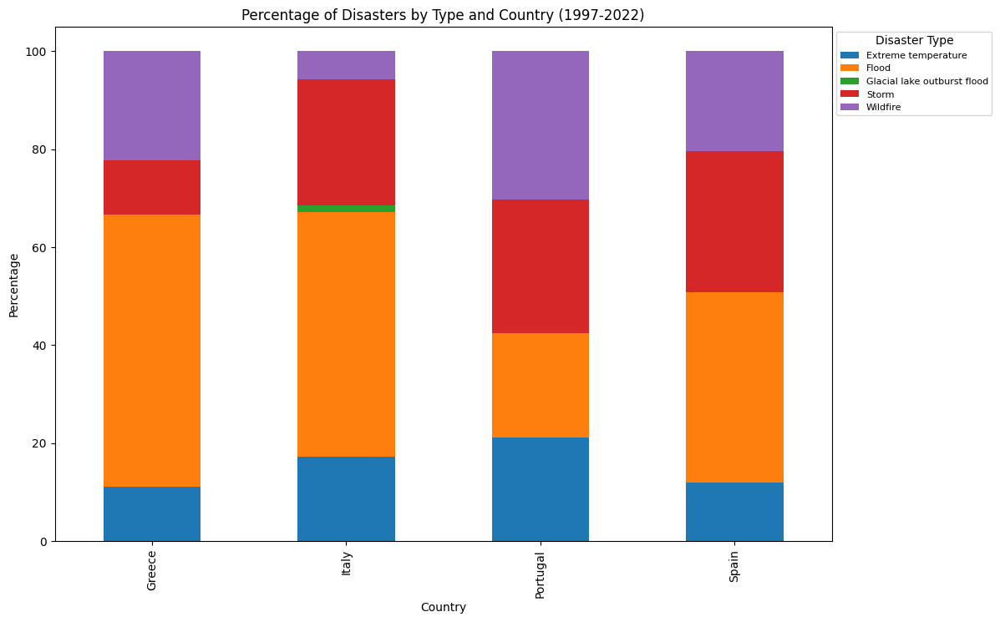

In [120]:
import matplotlib.pyplot as plt
%matplotlib inline

# Assuming your dataset is named 'df'
# (Include the filtering and grouping code from the previous example)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Plot a stacked bar chart for each country
percentage_df.plot(kind='bar', stacked=True, ax=ax)

# Set labels and title
plt.xlabel('Country')
plt.ylabel('Percentage')
plt.title('Percentage of Disasters by Type and Country (1997-2022)')

# Display the legend
plt.legend(title='Disaster Type', bbox_to_anchor=(1, 1), loc='upper left', fontsize=8, title_fontsize=10)

# Save the plot to a file (adjust the filename and format as needed)
plt.savefig('disasters_percentage_plot_97_22.png')

# Show the plot
plt.show()


In [121]:
# Assuming your DataFrame is named 'ext_filtered'
extreme_filtered = ext_filtered[(ext_filtered['start_year'] >= 1972) & (ext_filtered['start_year'] <= 1996)]

# Group the data by country and disaster type
extreme_grouped_df = extreme_filtered.groupby(['country', 'disaster_type']).size().reset_index(name='count')

# Pivot the table to have countries as rows, disaster types as columns, and counts as values
extreme_pivot_df = extreme_grouped_df.pivot(index='country', columns='disaster_type', values='count').fillna(0)

# Display the resulting DataFrame
extreme_pivot_df



disaster_type,Extreme temperature,Flood,Storm,Wildfire
country,,,,
Greece,4.0,3.0,2.0,6.0
Italy,0.0,10.0,10.0,4.0
Portugal,0.0,6.0,2.0,4.0
Spain,3.0,12.0,9.0,6.0


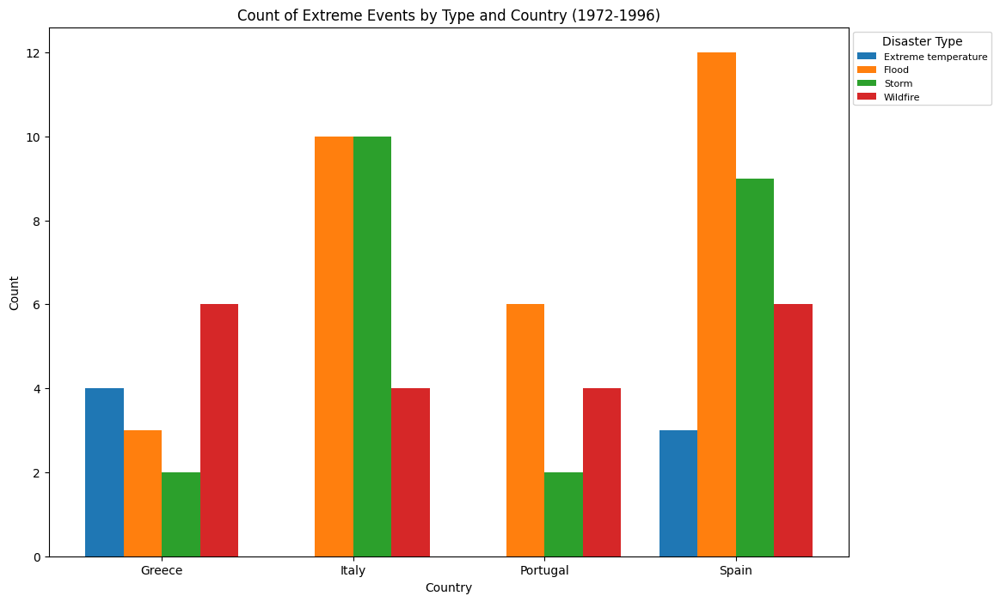

In [122]:
fig, ax = plt.subplots(figsize=(12, 8))

# Set the bar width
bar_width = 0.2

# Create a bar for each country and disaster type
countries = extreme_pivot_df.index
bar_positions = np.arange(len(countries))

for i, disaster_type in enumerate(extreme_pivot_df.columns):
    counts = extreme_pivot_df[disaster_type]
    ax.bar(bar_positions + i * bar_width, counts, width=bar_width, label=disaster_type)

# Set labels and title
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Count of Extreme Events by Type and Country (1972-1996)')

# Set the x-axis ticks
ax.set_xticks(bar_positions + bar_width * (len(extreme_pivot_df.columns) - 1) / 2)
ax.set_xticklabels(countries)

# Display the legend
plt.legend(title='Disaster Type', bbox_to_anchor=(1, 1), loc='upper left', fontsize=8, title_fontsize=10)

# Save the plot to a file (adjust the filename and format as needed)
plt.savefig('extreme_events_count_grouped_plot_72_96.png')

# Show the plot
plt.show()

In [123]:
#your DataFrame is named 'ext_filtered'
extreme_filtered2 = ext_filtered[(ext_filtered['start_year'] >= 1997) & (ext_filtered['start_year'] <= 2022)]

# Group the data by country and disaster type
extreme_grouped_df2 = extreme_filtered2.groupby(['country', 'disaster_type']).size().reset_index(name='count')

# Pivot the table to have countries as rows, disaster types as columns, and counts as values
extreme_pivot_df2 = extreme_grouped_df2.pivot(index='country', columns='disaster_type', values='count').fillna(0)

# Display the resulting DataFrame
extreme_pivot_df2


disaster_type,Extreme temperature,Flood,Glacial lake outburst flood,Storm,Wildfire
country,,,,,
Greece,5.0,25.0,0.0,5.0,10.0
Italy,12.0,35.0,1.0,18.0,4.0
Portugal,7.0,7.0,0.0,9.0,10.0
Spain,7.0,23.0,0.0,17.0,12.0


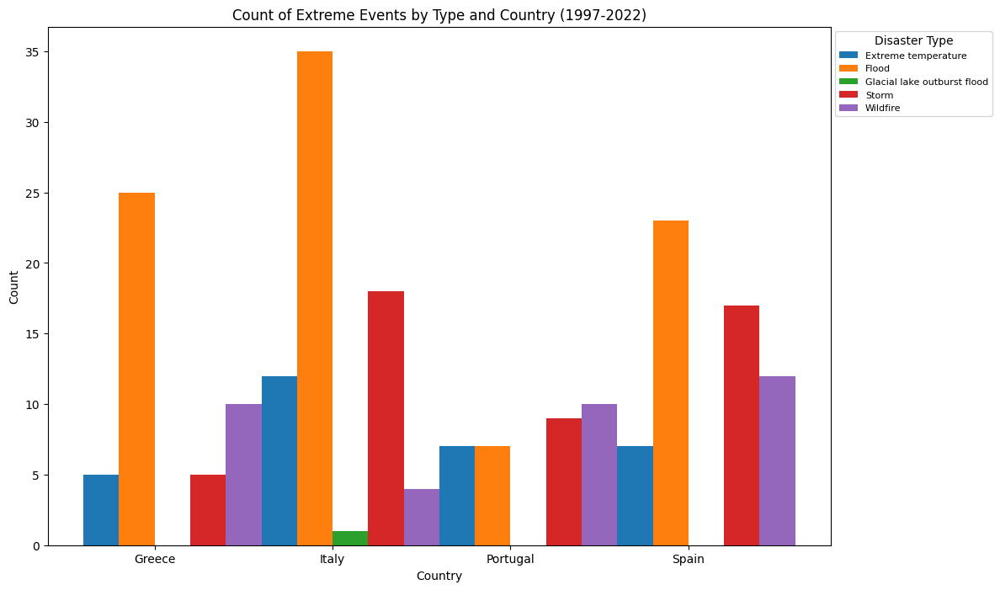

In [124]:
fig, ax = plt.subplots(figsize=(12, 8))

# Set the bar width
bar_width = 0.2

# Create a bar for each country and disaster type
countries = extreme_pivot_df2.index
bar_positions = np.arange(len(countries))

for i, disaster_type in enumerate(extreme_pivot_df2.columns):
    counts = extreme_pivot_df2[disaster_type]
    ax.bar(bar_positions + i * bar_width, counts, width=bar_width, label=disaster_type)

# Set labels and title
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Count of Extreme Events by Type and Country (1997-2022)')

# Set the x-axis ticks
ax.set_xticks(bar_positions + bar_width * (len(extreme_pivot_df.columns) - 1) / 2)
ax.set_xticklabels(countries)

# Display the legend
plt.legend(title='Disaster Type', bbox_to_anchor=(1, 1), loc='upper left', fontsize=8, title_fontsize=10)

# Save the plot to a file (adjust the filename and format as needed)
plt.savefig('extreme_events_count_grouped_plot_97_22.png')

# Show the plot
plt.show()

In [125]:
#calcucate the increase from 1997-22 to 72-96
increase_df = (extreme_pivot_df2 - extreme_pivot_df)
# Calculate the percentage increase
#percentage_increase_df = (increase_df / extreme_pivot_df) * 100

# Display the percentage increase DataFrame
print("Increase in Extreme Events from Period A to Period B:")
increase_df

Increase in Extreme Events from Period A to Period B:


disaster_type,Extreme temperature,Flood,Glacial lake outburst flood,Storm,Wildfire
country,,,,,
Greece,1.0,22.0,NaN,3.0,4.0
Italy,12.0,25.0,NaN,8.0,0.0
Portugal,7.0,1.0,NaN,7.0,6.0
Spain,4.0,11.0,NaN,8.0,6.0


In [126]:
df3

,country,temp_100_year_avg_1922_2022,temp_50_year_avg_1972_2022,temp_25_year_avg_1997_2022,temp_10_year_avg_2012_2022,avg_2022,indicator,unit,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
0,Portugal,15.3,15.6,16.0,16.2,16.9,Temperature change with respect to a baseline ...,Degree Celsius,-0.906,-0.063,-0.439,-0.090,-0.357,-0.272,0.167,0.169,0.282,0.546,0.560,0.286,-0.120,0.528,0.094,0.752,0.637,1.117,1.401,0.440,0.434,-0.199,0.684,1.663,0.756,1.601,1.212,0.634,0.665,1.165,0.681,1.458,1.062,1.032,1.561,0.775,0.649,1.423,1.122,1.615,0.797,0.941,1.349,1.405,1.682,2.109,0.906,1.291,1.990,1.251,2.318
1,Spain,13.4,13.8,14.2,14.5,15.3,Temperature change with respect to a baseline ...,Degree Celsius,-0.825,-0.164,-0.434,-0.091,-0.367,-0.160,0.101,0.276,0.186,0.344,0.709,0.550,-0.163,0.484,0.259,0.724,0.796,1.039,1.446,0.209,0.305,-0.059,1.044,1.444,0.722,1.535,1.189,0.814,0.810,1.406,0.812,1.598,1.004,0.902,1.526,0.835,0.864,1.360,0.908,1.613,1.043,0.906,1.603,1.533,1.714,2.036,1.149,1.534,2.083,1.431,2.489
2,Greece,13.9,14.0,14.5,14.8,14.9,Temperature change with respect to a baseline ...,Degree Celsius,-0.177,-0.357,-0.193,-0.250,-0.916,0.330,-0.555,0.179,-0.379,-0.191,-0.243,-0.493,-0.123,-0.063,0.312,-0.395,0.129,-0.204,0.368,-0.197,-0.528,-0.328,1.060,-0.043,-0.161,-0.195,0.632,0.800,0.679,1.314,0.435,0.385,0.337,0.213,0.254,1.080,0.881,0.771,1.584,0.394,1.235,1.317,1.060,0.904,1.561,0.642,1.905,1.381,1.307,1.655,1.040
3,Italy,12.6,12.9,13.4,13.7,14.4,Temperature change with respect to a baseline ...,Degree Celsius,-0.132,0.034,-0.115,0.075,-0.320,0.283,-0.537,0.022,-0.421,-0.279,0.511,0.384,-0.468,0.117,0.436,0.192,0.842,0.417,1.132,0.029,0.542,0.527,1.513,0.418,0.233,0.931,0.969,0.918,1.243,1.533,0.913,1.526,0.746,0.563,0.840,1.552,1.133,1.234,0.755,1.253,1.543,1.006,1.638,1.704,1.716,1.606,1.834,1.698,1.902,1.569,2.135


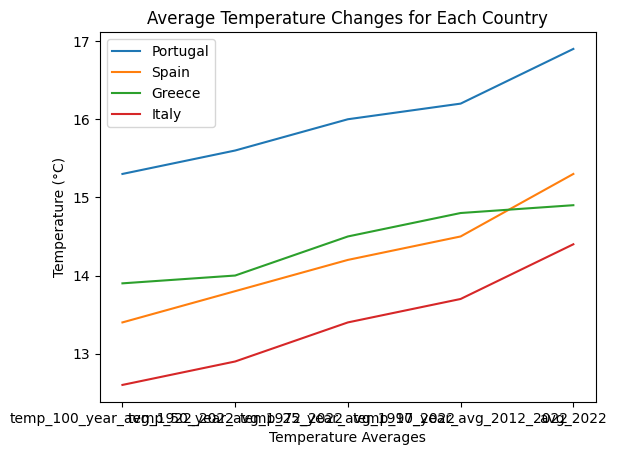

In [127]:
# Selecting columns with average temperature information
avg_temp_columns = ['temp_100_year_avg_1922_2022', 'temp_50_year_avg_1972_2022', 'temp_25_year_avg_1997_2022', 'temp_10_year_avg_2012_2022', 'avg_2022']

# Plotting for each country
for index, row in df3.iterrows():
    country = row['country']
    avg_temp_values = row[avg_temp_columns]

    plt.plot(avg_temp_values, label=country)

# Adding labels and title
plt.xlabel('Temperature Averages')
plt.ylabel('Temperature (°C)')
plt.title('Average Temperature Changes for Each Country')
plt.legend()
plt.savefig('average_temp_changes.png')

plt.show()

In [128]:
columns_to_sum = df3.loc[:, 'F1972':'F1996']
columns_to_sum_2 = df3.loc[:, 'F1997':'F2022']
# Adding a new column 'sum_F1972_F1996' containing the sum for each row
df3['sum_F1972_F1996'] = columns_to_sum.sum(axis=1)
df3['sum_F1997_F2022'] = columns_to_sum_2.sum(axis=1)
# Adding a new column 'avg_F1972_F1996' by dividing the sum by 25
df3['avg_F1972_F1996'] = df3['sum_F1972_F1996'] / 25
df3['avg_F1997_F2022'] = df3['sum_F1997_F2022'] /26
# Displaying the updated DataFrame

df3

,country,temp_100_year_avg_1922_2022,temp_50_year_avg_1972_2022,temp_25_year_avg_1997_2022,temp_10_year_avg_2012_2022,avg_2022,indicator,unit,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,sum_F1972_F1996,sum_F1997_F2022,avg_F1972_F1996,avg_F1997_F2022
0,Portugal,15.3,15.6,16.0,16.2,16.9,Temperature change with respect to a baseline ...,Degree Celsius,-0.906,-0.063,-0.439,-0.090,-0.357,-0.272,0.167,0.169,0.282,0.546,0.560,0.286,-0.120,0.528,0.094,0.752,0.637,1.117,1.401,0.440,0.434,-0.199,0.684,1.663,0.756,1.601,1.212,0.634,0.665,1.165,0.681,1.458,1.062,1.032,1.561,0.775,0.649,1.423,1.122,1.615,0.797,0.941,1.349,1.405,1.682,2.109,0.906,1.291,1.990,1.251,2.318,8.070,32.694,0.32280,1.257462
1,Spain,13.4,13.8,14.2,14.5,15.3,Temperature change with respect to a baseline ...,Degree Celsius,-0.825,-0.164,-0.434,-0.091,-0.367,-0.160,0.101,0.276,0.186,0.344,0.709,0.550,-0.163,0.484,0.259,0.724,0.796,1.039,1.446,0.209,0.305,-0.059,1.044,1.444,0.722,1.535,1.189,0.814,0.810,1.406,0.812,1.598,1.004,0.902,1.526,0.835,0.864,1.360,0.908,1.613,1.043,0.906,1.603,1.533,1.714,2.036,1.149,1.534,2.083,1.431,2.489,8.375,34.697,0.33500,1.334500
2,Greece,13.9,14.0,14.5,14.8,14.9,Temperature change with respect to a baseline ...,Degree Celsius,-0.177,-0.357,-0.193,-0.250,-0.916,0.330,-0.555,0.179,-0.379,-0.191,-0.243,-0.493,-0.123,-0.063,0.312,-0.395,0.129,-0.204,0.368,-0.197,-0.528,-0.328,1.060,-0.043,-0.161,-0.195,0.632,0.800,0.679,1.314,0.435,0.385,0.337,0.213,0.254,1.080,0.881,0.771,1.584,0.394,1.235,1.317,1.060,0.904,1.561,0.642,1.905,1.381,1.307,1.655,1.040,-3.418,23.571,-0.13672,0.906577
3,Italy,12.6,12.9,13.4,13.7,14.4,Temperature change with respect to a baseline ...,Degree Celsius,-0.132,0.034,-0.115,0.075,-0.320,0.283,-0.537,0.022,-0.421,-0.279,0.511,0.384,-0.468,0.117,0.436,0.192,0.842,0.417,1.132,0.029,0.542,0.527,1.513,0.418,0.233,0.931,0.969,0.918,1.243,1.533,0.913,1.526,0.746,0.563,0.840,1.552,1.133,1.234,0.755,1.253,1.543,1.006,1.638,1.704,1.716,1.606,1.834,1.698,1.902,1.569,2.135,5.435,34.460,0.21740,1.325385


In [130]:
#find the temperature change
df3['temperature change'] = df3['avg_F1997_F2022'] - df3['avg_F1972_F1996'] 
df3

,country,temp_100_year_avg_1922_2022,temp_50_year_avg_1972_2022,temp_25_year_avg_1997_2022,temp_10_year_avg_2012_2022,avg_2022,indicator,unit,F1972,F1973,F1974,F1975,F1976,F1977,F1978,F1979,F1980,F1981,F1982,F1983,F1984,F1985,F1986,F1987,F1988,F1989,F1990,F1991,F1992,F1993,F1994,F1995,F1996,F1997,F1998,F1999,F2000,F2001,F2002,F2003,F2004,F2005,F2006,F2007,F2008,F2009,F2010,F2011,F2012,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022,sum_F1972_F1996,sum_F1997_F2022,avg_F1972_F1996,avg_F1997_F2022,temperature change
0,Portugal,15.3,15.6,16.0,16.2,16.9,Temperature change with respect to a baseline ...,Degree Celsius,-0.906,-0.063,-0.439,-0.090,-0.357,-0.272,0.167,0.169,0.282,0.546,0.560,0.286,-0.120,0.528,0.094,0.752,0.637,1.117,1.401,0.440,0.434,-0.199,0.684,1.663,0.756,1.601,1.212,0.634,0.665,1.165,0.681,1.458,1.062,1.032,1.561,0.775,0.649,1.423,1.122,1.615,0.797,0.941,1.349,1.405,1.682,2.109,0.906,1.291,1.990,1.251,2.318,8.070,32.694,0.32280,1.257462,0.934662
1,Spain,13.4,13.8,14.2,14.5,15.3,Temperature change with respect to a baseline ...,Degree Celsius,-0.825,-0.164,-0.434,-0.091,-0.367,-0.160,0.101,0.276,0.186,0.344,0.709,0.550,-0.163,0.484,0.259,0.724,0.796,1.039,1.446,0.209,0.305,-0.059,1.044,1.444,0.722,1.535,1.189,0.814,0.810,1.406,0.812,1.598,1.004,0.902,1.526,0.835,0.864,1.360,0.908,1.613,1.043,0.906,1.603,1.533,1.714,2.036,1.149,1.534,2.083,1.431,2.489,8.375,34.697,0.33500,1.334500,0.999500
2,Greece,13.9,14.0,14.5,14.8,14.9,Temperature change with respect to a baseline ...,Degree Celsius,-0.177,-0.357,-0.193,-0.250,-0.916,0.330,-0.555,0.179,-0.379,-0.191,-0.243,-0.493,-0.123,-0.063,0.312,-0.395,0.129,-0.204,0.368,-0.197,-0.528,-0.328,1.060,-0.043,-0.161,-0.195,0.632,0.800,0.679,1.314,0.435,0.385,0.337,0.213,0.254,1.080,0.881,0.771,1.584,0.394,1.235,1.317,1.060,0.904,1.561,0.642,1.905,1.381,1.307,1.655,1.040,-3.418,23.571,-0.13672,0.906577,1.043297
3,Italy,12.6,12.9,13.4,13.7,14.4,Temperature change with respect to a baseline ...,Degree Celsius,-0.132,0.034,-0.115,0.075,-0.320,0.283,-0.537,0.022,-0.421,-0.279,0.511,0.384,-0.468,0.117,0.436,0.192,0.842,0.417,1.132,0.029,0.542,0.527,1.513,0.418,0.233,0.931,0.969,0.918,1.243,1.533,0.913,1.526,0.746,0.563,0.840,1.552,1.133,1.234,0.755,1.253,1.543,1.006,1.638,1.704,1.716,1.606,1.834,1.698,1.902,1.569,2.135,5.435,34.460,0.21740,1.325385,1.107985
